# Training file for UpscaleNN

## Imports

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import src.nntools as nt
from src.CarlaDataset import CarlaDataset, CarlaDatasetPatch
import skimage.metrics as metrics
import platform  # Import the platform module to detect the OS
import cv2

device = None
if platform.system() == 'Windows':  # Check if the OS is Windows
    import torch_directml  # Import torch_directml only on Windows
    device = torch_directml.device()


if not device:
    if torch.cuda.is_available():
        device = torch.device('cuda')
        torch.cuda.empty_cache()
    else:
        device = torch.device('cpu')

from src.UpscaleNN import UpscaleNN

print(device)

cuda


# Utility function

In [2]:
class SuperResolutionStatsManager(nt.StatsManager):
    def __init__(self):
        super(SuperResolutionStatsManager, self).__init__()

    def init(self):
        super(SuperResolutionStatsManager, self).init()
        # Initializing `self.running_psnr`
        self.running_psnr = 0
        self.running_ssim = 0

    def accumulate(self, loss, x, y, d):
        super(SuperResolutionStatsManager, self).accumulate(loss, x, y, d)
        # Updating `self.running_psnr`
        d_numpy = d.detach().to('cpu').numpy()
        y_numpy = y.detach().to('cpu').numpy()

        self.running_psnr += metrics.peak_signal_noise_ratio(d_numpy, y_numpy)

        current_ssim = 0

        for i in range(d_numpy.shape[0]):
            d_numpy_temp = np.moveaxis(d_numpy[i], [0, 1, 2], [2, 0, 1])
            y_numpy_temp = np.moveaxis(y_numpy[i], [0, 1, 2], [2, 0, 1])

            value_range = max(d_numpy_temp.max(), y_numpy_temp.max()) - min(d_numpy_temp.min(), y_numpy_temp.min())
            
            current_ssim += metrics.structural_similarity(d_numpy_temp, y_numpy_temp, win_size=7, data_range=value_range, multichannel=True, channel_axis=2)
        
        self.running_ssim += current_ssim / d_numpy.shape[0]

    def summarize(self):
        loss = super(SuperResolutionStatsManager, self).summarize()
        psnr = self.running_psnr / (self.number_update+1e-9 )
        ssim = self.running_ssim / (self.number_update+1e-9 )
        return {'loss': loss, 'psnr': psnr, "ssim": ssim}

def criterion(y, d):
    return F.mse_loss(y, d)

#show image
def myimshow(image, ax=plt):
    image = image.detach().to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    # ax.axis('off')
    return h

In [3]:
def tensor_to_numpy(tensor):
    return tensor.detach().cpu().numpy().transpose(1, 2, 0)

def tensor_to_image(tensor):
    return cv2.cvtColor(tensor_to_numpy(tensor), cv2.COLOR_BGR2RGB)

def numpy_to_tensor(numpy):
    return torch.from_numpy(numpy.astype(np.float32).transpose(2, 0, 1))

## Data loader

In [4]:
new_img_size = 256
common_transform = transforms.Compose([
    #transforms.RandomHorizontalFlip(),
    #transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
])

train_transform = transforms.Compose([
    common_transform,
    #transforms.RandomRotation(degrees=10),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    #transforms.RandomResizedCrop(size=(new_img_size, new_img_size), scale=(0.8, 1.0), ratio=(0.75, 1.333)),
])

valid_transform = transforms.Compose([
    common_transform,
    #transforms.CenterCrop((new_img_size, new_img_size)),
])

In [5]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
#import your datasetclass

PATCH_SIZE = 32

full_train_dataset = CarlaDatasetPatch("1920x1080", "960x540", "train", transforms=train_transform, download=True, patch_size=PATCH_SIZE)
full_test_dataset = CarlaDatasetPatch("1920x1080", "960x540", "test", transforms=train_transform, download=True, patch_size=PATCH_SIZE)

train_dataset_patched = CarlaDatasetPatch("1920x1080", "960x540", "train", transforms=train_transform, download=True, patch_size=PATCH_SIZE)
test_dataset_patched = CarlaDatasetPatch("1920x1080", "960x540", "test", transforms=train_transform, download=True, patch_size=PATCH_SIZE)

SUBSET_SIZE = 4000
if len(train_dataset_patched) > SUBSET_SIZE:
    train_dataset_patched.limit_dataset(SUBSET_SIZE)

if len(test_dataset_patched) > SUBSET_SIZE * 0.2:
    test_dataset_patched.limit_dataset(int(SUBSET_SIZE * 0.2))

print("Size of sub train dataset", len(train_dataset_patched))
print("Size of sub test dataset", len(test_dataset_patched))

Dataset already present
Dataset already present
Dataset already present
Dataset already present
Size of sub train dataset 4000
Size of sub test dataset 800


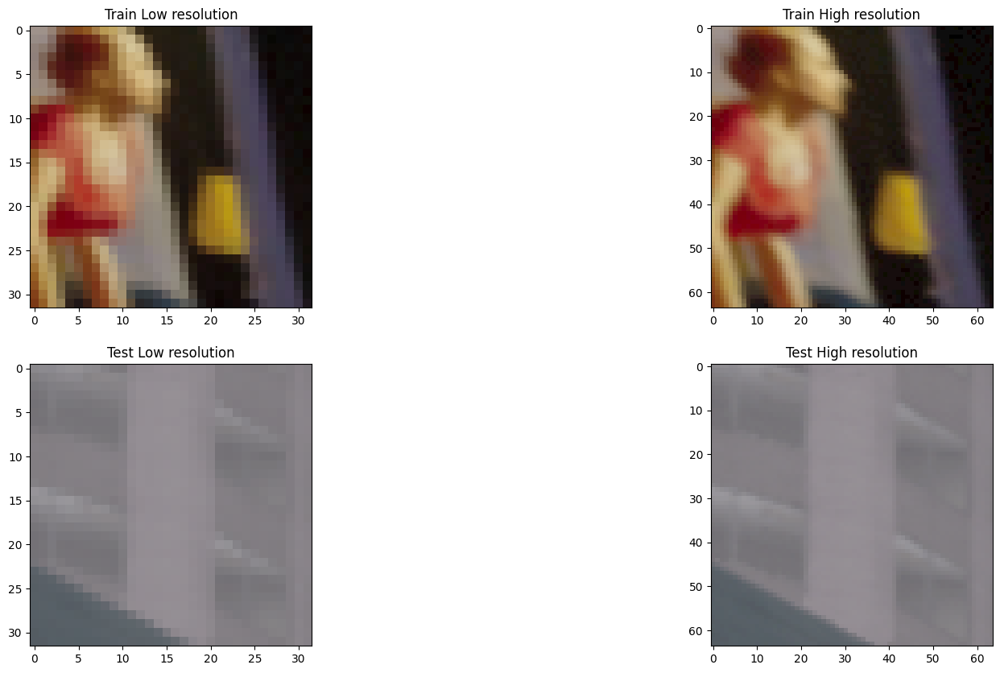

In [6]:
# Show one full image for both train and test
example1_low, example1_high = full_train_dataset[0]
example2_low, example2_high = full_test_dataset[0]

example1_low_image = tensor_to_image(example1_low)
example1_high_image = tensor_to_image(example1_high)

example2_low_image = tensor_to_image(example2_low)
example2_high_image = tensor_to_image(example2_high)

fig, ax = plt.subplots(2, 2, figsize=(20, 10))
ax[0, 0].imshow(example1_low_image)
ax[0, 0].set_title("Train Low resolution")
ax[0, 1].imshow(example1_high_image)
ax[0, 1].set_title("Train High resolution")
ax[1, 0].imshow(example2_low_image)
ax[1, 0].set_title("Test Low resolution")
ax[1, 1].imshow(example2_high_image)
ax[1, 1].set_title("Test High resolution")

plt.show()

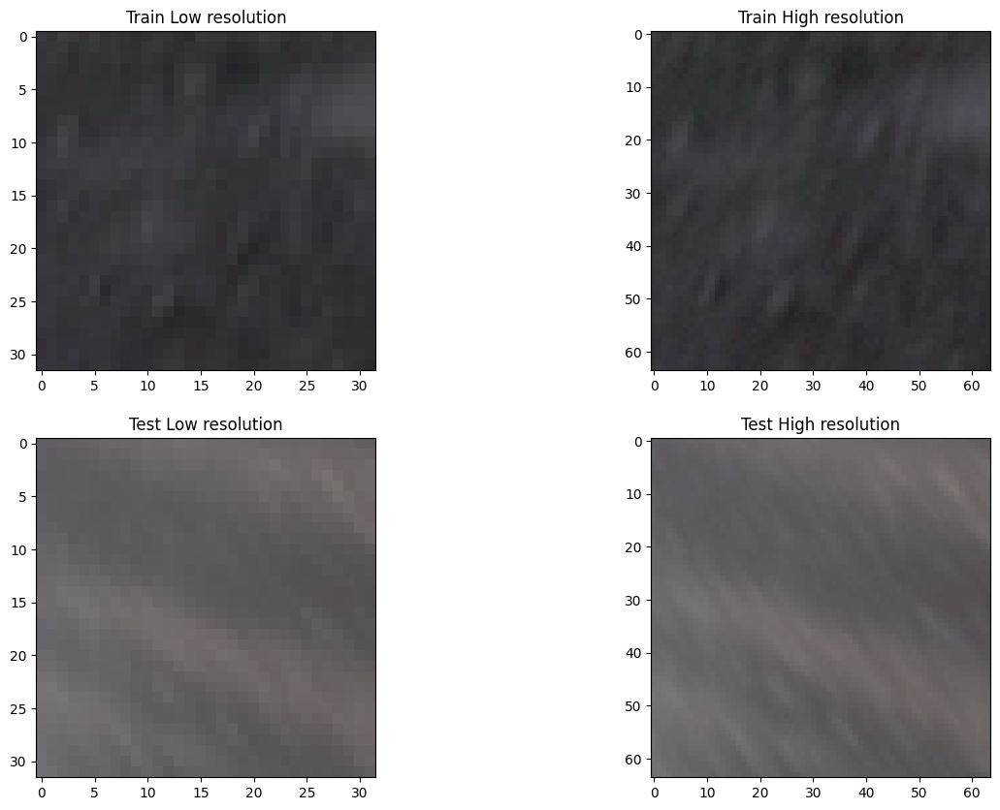

In [7]:
# Do the same for the patched dataset
example1_low, example1_high = train_dataset_patched[0]
example2_low, example2_high = test_dataset_patched[0]

example1_low_image = tensor_to_image(example1_low)
example1_high_image = tensor_to_image(example1_high)

example2_low_image = tensor_to_image(example2_low)
example2_high_image = tensor_to_image(example2_high)

fig, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0, 0].imshow(example1_low_image)
ax[0, 0].set_title("Train Low resolution")
ax[0, 1].imshow(example1_high_image)
ax[0, 1].set_title("Train High resolution")
ax[1, 0].imshow(example2_low_image)
ax[1, 0].set_title("Test Low resolution")
ax[1, 1].imshow(example2_high_image)
ax[1, 1].set_title("Test High resolution")

plt.show()

In [8]:
# Plot for the the predicted image, low resolution image and high resolution image in first row
# plot Plot the loss, psnr and ssim curves in the second row
def plot_images_and_metrics(exp, fig, axes, dataset, index): ##Only to use when perform_validation_during_training == True
    low_res, high_res = dataset[index]

    with torch.no_grad():
        predicted_res = exp.net(low_res.to(device))[0]

    axes[0][0].clear()
    axes[0][1].clear()
    axes[0][2].clear()
    axes[1][0].clear()
    axes[1][1].clear()
    axes[1][2].clear()

    low_res_image = tensor_to_image(low_res)
    high_res_image = tensor_to_image(high_res)
    predicted_res_image = tensor_to_image(predicted_res)

    axes[0][0].set_title(f'Low res: {low_res_image.shape}')
    axes[0][1].set_title(f'High res: {high_res_image.shape}')
    axes[0][2].set_title(f'Predicted res: {predicted_res_image.shape}')


    axes[0][0].imshow(low_res_image)
    axes[0][1].imshow(high_res_image)
    axes[0][2].imshow(predicted_res_image)

    axes[1][0].plot([exp.history[k][0]['loss'] for k in range(exp.epoch)], label="Train loss")
    axes[1][1].plot([exp.history[k][0]['psnr'] for k in range(exp.epoch)], label="Train psnr")
    axes[1][2].plot([exp.history[k][0]['ssim'] for k in range(exp.epoch)], label="Train ssim")

    axes[1][0].plot([exp.history[k][1]['loss'] for k in range(exp.epoch)], label="Eval loss")
    axes[1][1].plot([exp.history[k][1]['psnr'] for k in range(exp.epoch)], label="Eval psnr")
    axes[1][2].plot([exp.history[k][1]['ssim'] for k in range(exp.epoch)], label="Eval ssim")

    axes[1][0].legend()
    axes[1][0].set_xlabel("Epoch")
    axes[1][0].set_ylabel("Loss")        
    axes[1][1].legend()
    axes[1][1].set_xlabel("Epoch")
    axes[1][1].set_ylabel("PSNR") 
    axes[1][2].legend()
    axes[1][2].set_xlabel("Epoch")
    axes[1][2].set_ylabel("SSIM")

## Training a model on a small dataset 

In [9]:
small_dataset_size = 10
small_dataset = [train_dataset_patched[np.random.randint(len(train_dataset_patched))] for _ in range(small_dataset_size)]

small_train_size = int(0.8 * len(small_dataset))
small_valid_size = len(small_dataset) - small_train_size
small_train_dataset, small_valid_dataset = torch.utils.data.random_split(small_dataset, [small_train_size, small_valid_size])

print("Size of small_train_dataset:", len(small_train_dataset))

Size of small_train_dataset: 8


In [10]:
lr = 1e-3
r = UpscaleNN()
torch.cuda.empty_cache()
r = r.to(device)
# In mega bytes
print("Size of model mb", sum(p.numel() for p in r.parameters() if p.requires_grad) / (1024 * 1024))
# Size of batch in mega bytes
print("Size of batch mb", small_dataset[0][0].shape[0] * small_dataset[0][0].shape[1] * small_dataset[0][0].shape[2] * 4 / (1024 * 1024))

adam = torch.optim.Adam(r.parameters(), lr=lr)
stats_manager = SuperResolutionStatsManager()
path = "results/smallbatchexperiment-upscale"
exp = nt.Experiment(r, small_dataset, small_valid_dataset, adam, stats_manager, device, criterion, batch_size=1,
                     output_dir=path, perform_validation_during_training=True)

# Show number of parameters
print("Number of parameters:", sum(p.numel() for p in r.parameters() if p.requires_grad))

Size of model mb 0.06750869750976562
Size of batch mb 0.01171875
Number of parameters: 70788


Start/Continue training from epoch 50


/home/maxence/miniconda3/envs/tf/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Finish training for 50 epochs


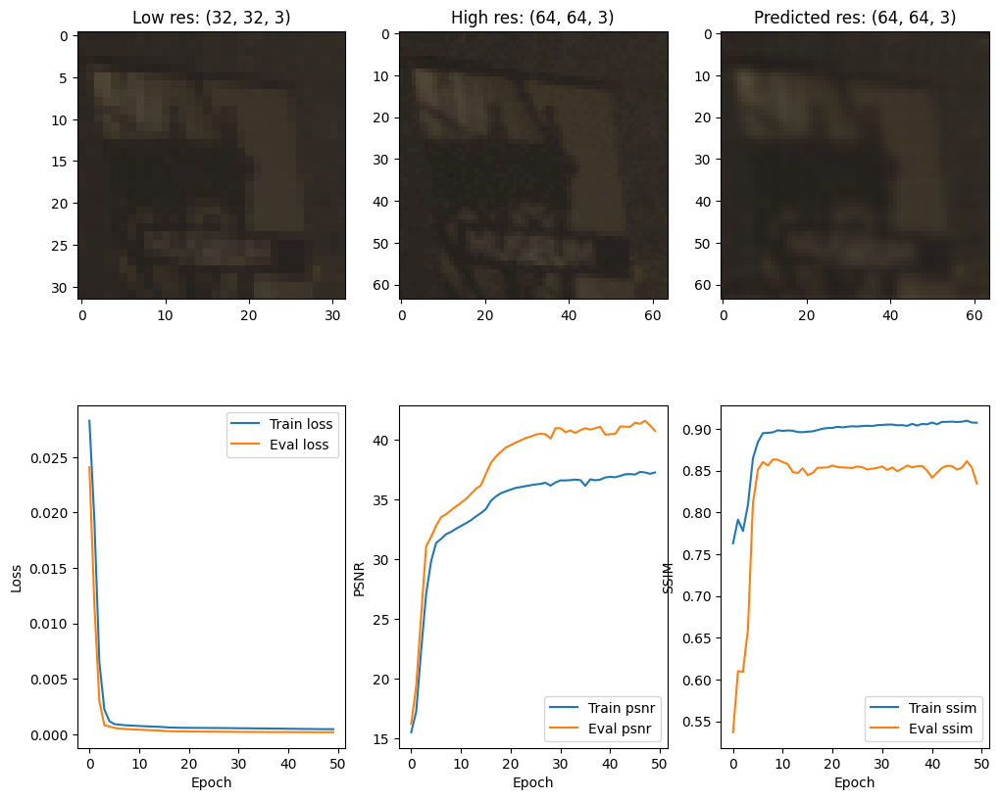

In [11]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(12, 10))
exp.run(num_epochs=50, plot=lambda exp: plot_images_and_metrics(exp, fig, axes, small_valid_dataset, np.random.randint(len(small_valid_dataset))))

In [12]:
# Show three images for a set and predict it
def plot_images_from_model(model, dataset, num_images=1, indices=None):
    images = []

    num_images = max(num_images, len(indices) if indices else 0)

    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    print(num_images)

    for i in range(num_images):
        if indices:
            low_res, high_res = dataset[indices[i]]
            print("Chosen index", indices[i])
        else:
            index = np.random.randint(len(dataset))
            low_res, high_res = dataset[index]
            print("Chosen index", index)

        images.append(low_res)
        images.append(high_res)

        with torch.no_grad():
            predicted_res = model.net(low_res.to(device))[0]

        images.append(predicted_res)

        low_res_image = tensor_to_image(low_res)
        high_res_image = tensor_to_image(high_res)
        predicted_res_image = tensor_to_image(predicted_res)

        axes[i, 0].set_title(f'Low res: {low_res_image.shape}')
        axes[i, 1].set_title(f'High res: {high_res_image.shape}')
        axes[i, 2].set_title(f'Predicted res: {predicted_res_image.shape}')

        axes[i, 0].imshow(low_res_image)
        axes[i, 1].imshow(high_res_image)
        axes[i, 2].imshow(predicted_res_image)
    
    plt.show()


3
Chosen index 0
Chosen index 1
Chosen index 2


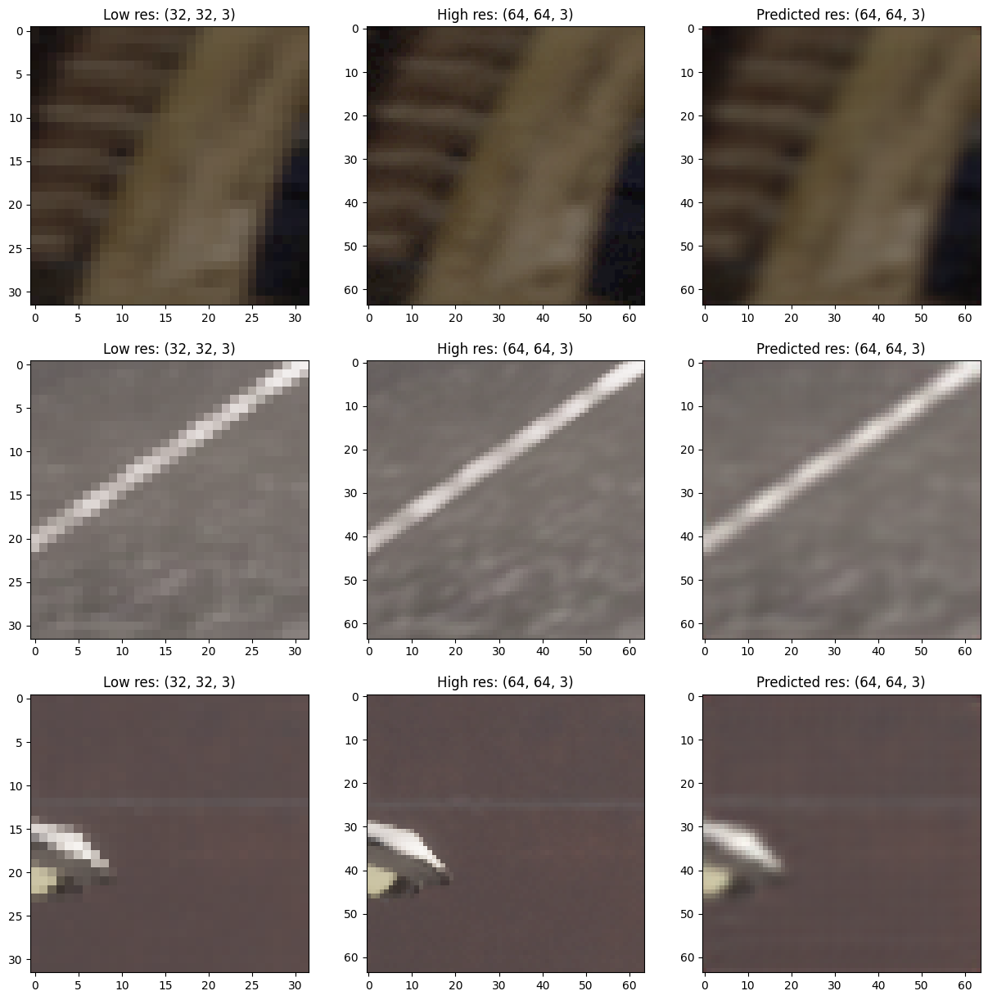

In [13]:
plot_images_from_model(exp, small_dataset, indices=[0, 1, 2])

# Training a model on a subsequent part of the original dataset

In [14]:

# Take the sub part of the dataset from random indices
train_size = int(0.8 * len(train_dataset_patched))
valid_size = len(train_dataset_patched) - train_size

train_sub_dataset, valid_sub_dataset = torch.utils.data.random_split(train_dataset_patched, [train_size, valid_size])

print("Size of train_dataset: ", len(train_sub_dataset))
print("Size of valid_dataset: ", len(valid_sub_dataset))

Size of train_dataset:  3200
Size of valid_dataset:  800


In [15]:
lr = 1e-3
batch_size = 32

torch.cuda.empty_cache()
r = UpscaleNN()
r = r.to(device)
adam = torch.optim.Adam(r.parameters(), lr=lr)
stats_manager = SuperResolutionStatsManager()
path = "results/superresol-upscale"
exp1 = nt.Experiment(r, train_sub_dataset, valid_sub_dataset, adam, stats_manager, device, criterion, batch_size=batch_size,
                     output_dir=path, perform_validation_during_training=True)

Start/Continue training from epoch 25
Finish training for 25 epochs


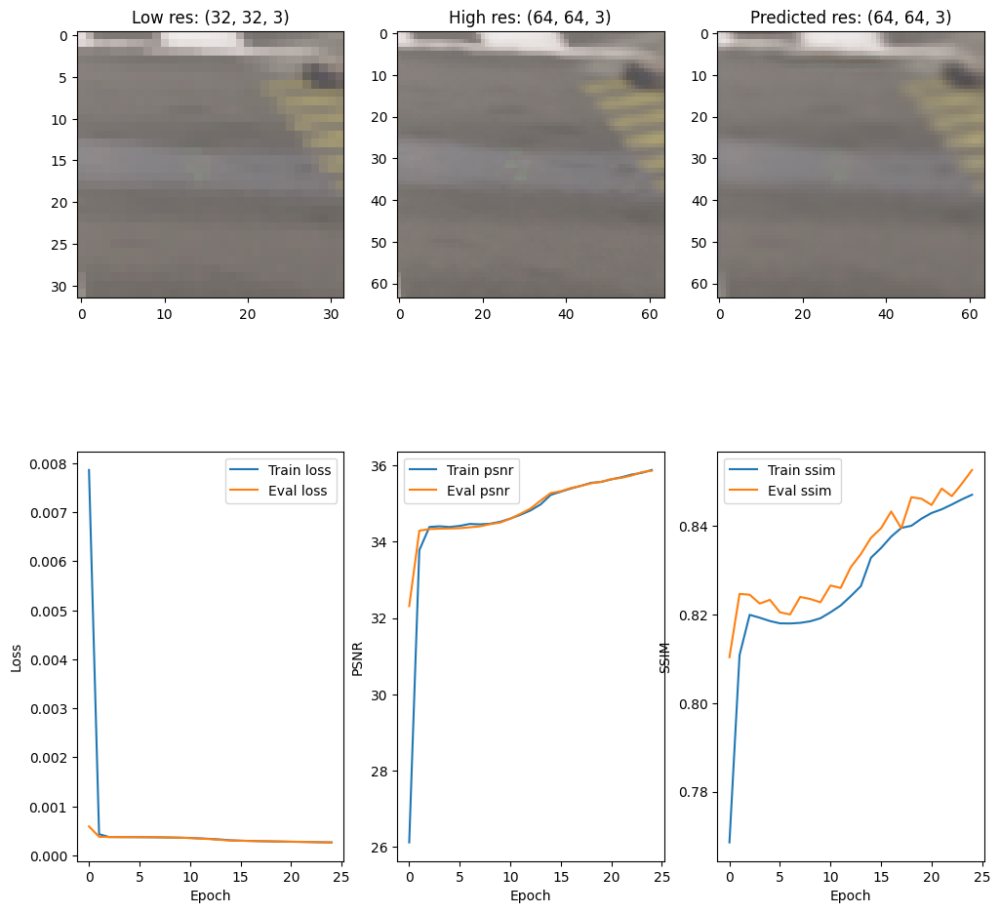

In [16]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(12, 12))
exp1.run(num_epochs=25, plot=lambda exp: plot_images_and_metrics(exp, fig, axes, test_dataset_patched, np.random.randint(len(test_dataset_patched))))
#exp1.run(num_epochs=3, plot=None)

4
Chosen index 288
Chosen index 261
Chosen index 625
Chosen index 263


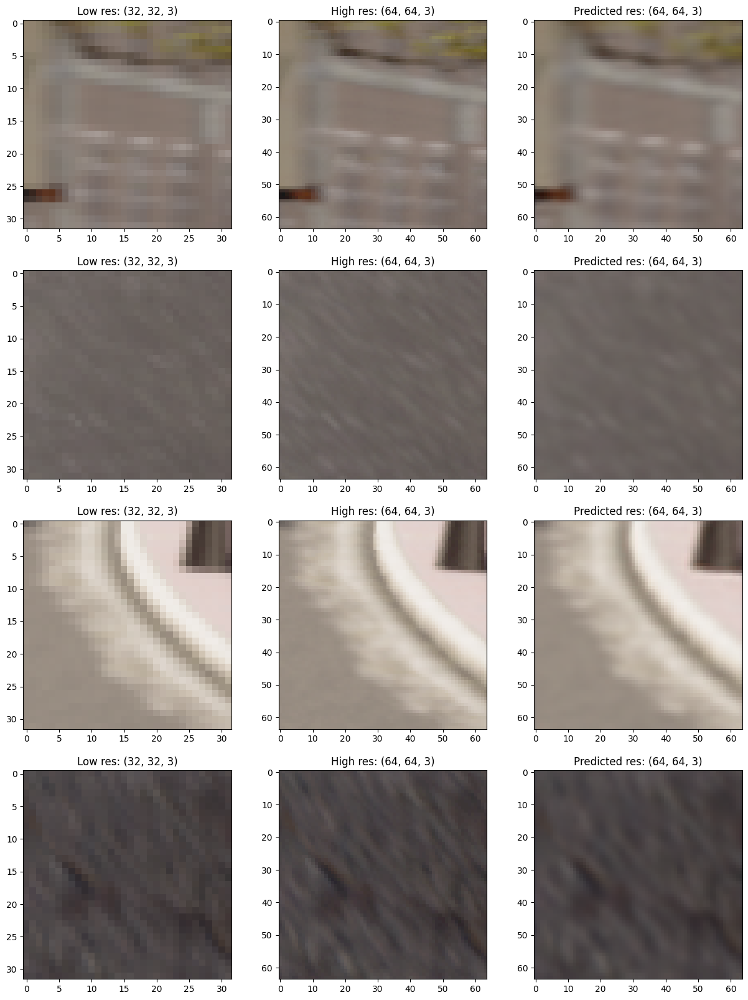

In [17]:
plot_images_from_model(exp1, test_dataset_patched, num_images=4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
Chosen index 85
Chosen index 372
Chosen index 99
Chosen index 166


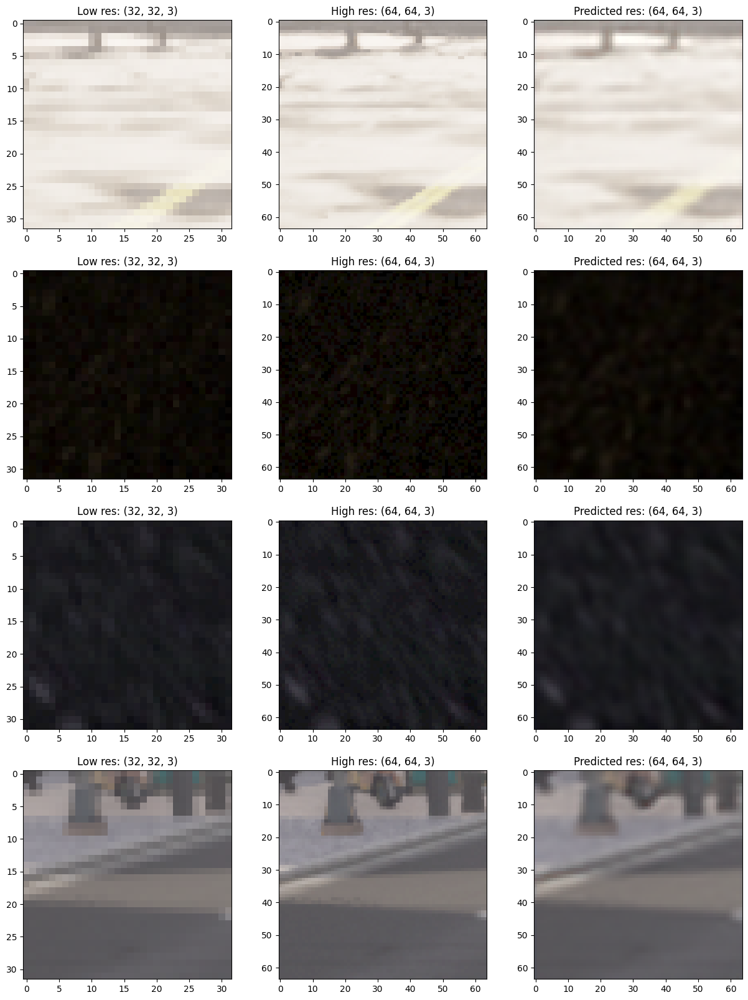

In [18]:
plot_images_from_model(exp1, test_dataset_patched, num_images=4)

# Reconstruct image from patch

In [19]:
import math

# Upscaling factor of this function is 2, so the predicted patch will be twice bigger
# Use a batch size of 32 to compute the predicted patch
def predict_full_image_by_patch(model, dest_width, dest_height, set, index, patch_size=32) -> torch.Tensor:
    scale_factor = 2
    predicted_image = np.zeros((dest_height, dest_width, 3), dtype=np.float32)

    # Return a list of patch images
    low_res, _ = set.get_all_patch_for_image(index)

    # Compute the number of patches in width and height
    num_patch_width = math.ceil(dest_width / scale_factor / patch_size)
    num_patch_height = math.ceil(dest_height / scale_factor / patch_size)
    num_patches = num_patch_width * num_patch_height
    
    batch_size = 1024

    computed_patch = []
    
    for i in range(0, num_patches, batch_size):
        # Number of patch and batch size might not be divisible
        # So we need to take the min of the two
        num_patch_to_compute = min(batch_size, num_patches - i)
        torch_patches_numpy = low_res[i:i+num_patch_to_compute]
        torch_patches = torch.from_numpy(torch_patches_numpy)

        with torch.no_grad():
            torch.cuda.empty_cache()
            batch = torch_patches.to(device, dtype=torch.float32)
            predicted_batch = model.net(batch)

            # Append each patch individually after transformed to numpy
            for j in range(len(predicted_batch)):
                computed_patch.append(predicted_batch[j].detach().to('cpu').numpy())

    sf = 2  # Scaling factor

    for i in range(num_patch_height):
        for j in range(num_patch_width):
            patch_index = i * num_patch_width + j
            patch = computed_patch[patch_index].transpose(1, 2, 0)
            
            image_x_start = j * patch_size * sf
            image_x_end = (j + 1) * patch_size * sf

            if image_x_end > dest_width:
                image_x_end = dest_width
                image_x_start = dest_width - patch_size * sf

            image_y_start = i * patch_size * sf
            image_y_end = (i + 1) * patch_size * sf

            if image_y_end > dest_height:
                image_y_end = dest_height
                image_y_start = dest_height - patch_size * sf

            predicted_image[image_y_start:image_y_end, image_x_start:image_x_end, :] = patch

    return numpy_to_tensor(predicted_image)

In [20]:
index_patch_train = np.random.randint(len(full_train_dataset))
index_patch_test = np.random.randint(len(full_test_dataset))

print("Choose index train", index_patch_train, "Choose index test", index_patch_test)

start_index_patch_train = full_train_dataset.get_index_start_patch(index_patch_train)
start_index_patch_test = full_test_dataset.get_index_start_patch(index_patch_test)

print ("Start index patch train", start_index_patch_train, "Start index patch test", start_index_patch_test)

index_train = full_train_dataset.get_index_for_image(index_patch_train)
index_test = full_test_dataset.get_index_for_image(index_patch_test)

print ("Index train", index_train, "Index test", index_test)

train_low_res, train_high_res = full_train_dataset.get_full_image(index_train)
test_low_res, test_high_res = full_test_dataset.get_full_image(index_test)

pred_high_res1 = predict_full_image_by_patch(exp1, 1920, 1080, full_train_dataset, index_patch_train)
pred_high_res2 = predict_full_image_by_patch(exp1, 1920, 1080, full_test_dataset, index_patch_test)

Choose index train 309127 Choose index test 22971
Start index patch train 309060 Start index patch test 22950
Index train 606 Index test 45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


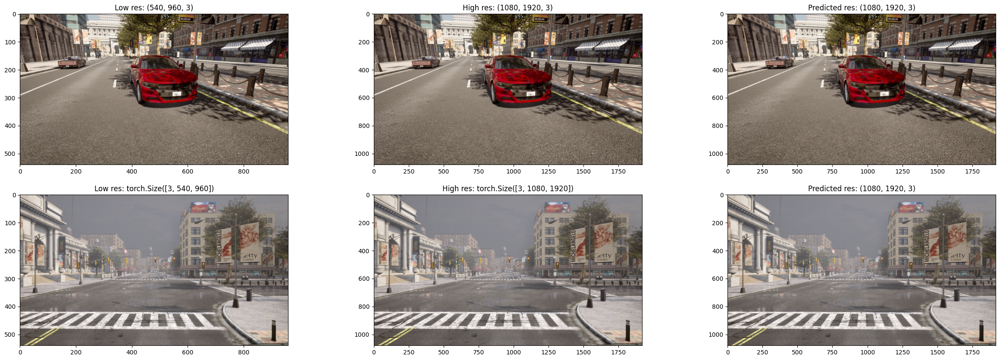

In [21]:
## Test on one image from the train and test set

fig, axes = plt.subplots(2, 3, figsize=(30, 10))

train_low_res_image = tensor_to_image(train_low_res)
train_high_res_image = tensor_to_image(train_high_res)
pred_high_res1_image = tensor_to_image(pred_high_res1)

axes[0][0].set_title(f'Low res: {train_low_res_image.shape}')
axes[0][1].set_title(f'High res: {train_high_res_image.shape}')
axes[0][2].set_title(f'Predicted res: {pred_high_res1_image.shape}')

axes[0][0].imshow(train_low_res_image)
axes[0][1].imshow(train_high_res_image)
axes[0][2].imshow(pred_high_res1_image)

test_low_res_image = tensor_to_image(test_low_res)
test_high_res_image = tensor_to_image(test_high_res)
pred_high_res2_image = tensor_to_image(pred_high_res2)

axes[1][0].set_title(f'Low res: {test_low_res.shape}')
axes[1][1].set_title(f'High res: {test_high_res.shape}')
axes[1][2].set_title(f'Predicted res: {pred_high_res2_image.shape}')

axes[1][0].imshow(test_low_res_image)
axes[1][1].imshow(test_high_res_image)
axes[1][2].imshow(pred_high_res2_image)

plt.show()

In [22]:
# Compute the PSNR and SSIM for the predicted image

train_high_res_np = tensor_to_numpy(train_high_res)
test_high_res_np = tensor_to_numpy(test_high_res)

pred_high_res1_np = tensor_to_numpy(pred_high_res1)
pred_high_res2_np = tensor_to_numpy(pred_high_res2)

print("PSNR for train image", metrics.peak_signal_noise_ratio(train_high_res_np, pred_high_res1_np))
print("SSIM for train image", metrics.structural_similarity(train_high_res_np, pred_high_res1_np, win_size=7, 
                                                            data_range=1, multichannel=True, channel_axis=2))

print("PSNR for test image", metrics.peak_signal_noise_ratio(test_high_res_np, pred_high_res2_np))
print("SSIM for test image", metrics.structural_similarity(test_high_res_np, pred_high_res2_np, win_size=7, 
                                                           data_range=1, multichannel=True, channel_axis=2))

PSNR for train image 29.964081734639116
SSIM for train image 0.87319833
PSNR for test image 35.270709407986914
SSIM for test image 0.946311


In [23]:
def compute_mean_psnr_ssim(model, dataset, subpart_size):
    psnr = 0
    ssim = 0

    # array of unique indices
    indices = np.random.choice(len(dataset), subpart_size, replace=False)

    for i in range(subpart_size):
        index_patch = indices[i]

        index_image = dataset.get_index_for_image(index_patch)
        
        low_res, high_res = dataset.get_full_image(index_image)
        pred_high_res = predict_full_image_by_patch(model, 1920, 1080, dataset, index_patch)

        high_res_np = tensor_to_numpy(high_res)
        pred_high_res_np = tensor_to_numpy(pred_high_res)

        psnr += metrics.peak_signal_noise_ratio(high_res_np, pred_high_res_np)
        ssim += metrics.structural_similarity(high_res_np, pred_high_res_np, win_size=7, data_range=1, multichannel=True, channel_axis=2)

        if i % (subpart_size // 10) == 0:
            print("Current index", i, "PSNR", psnr / (i+1), "SSIM", ssim / (i+1))

    return psnr / subpart_size, ssim / subpart_size

In [24]:
subpart_size = 10

# Compute the PSNR and SSIM for the predicted image on a subset of the train set
train_psnr, train_ssim = compute_mean_psnr_ssim(exp1, full_train_dataset, subpart_size)

# Compute the PSNR and SSIM for the predicted image on a subset of the test set
test_psnr, test_ssim = compute_mean_psnr_ssim(exp1, full_test_dataset, subpart_size)
print("Average PSNR for test images", test_psnr)
print("Average SSIM for test images", test_ssim)

print("Average PSNR for train images", train_psnr)
print("Average SSIM for train images", train_ssim)

Current index 0 PSNR 35.6993857877907 SSIM 0.9599854350090027
Current index 1 PSNR 36.450766568625085 SSIM 0.9506317973136902
Current index 2 PSNR 36.84402278312885 SSIM 0.9290597240130106
Current index 3 PSNR 35.61088720722793 SSIM 0.9340156763792038
Current index 4 PSNR 36.06029945164013 SSIM 0.9402637243270874
Current index 5 PSNR 36.36914771756867 SSIM 0.9317874809106191
Current index 6 PSNR 36.53840226825973 SSIM 0.9364574210984367
Current index 7 PSNR 37.09506370286613 SSIM 0.9406074583530426
Current index 8 PSNR 37.29538774578335 SSIM 0.9424588481585184
Current index 9 PSNR 37.04140532030756 SSIM 0.9424126029014588
Current index 0 PSNR 37.58740328006031 SSIM 0.9502341151237488
Current index 1 PSNR 36.24894216924751 SSIM 0.9454901218414307
Current index 2 PSNR 34.17402720256506 SSIM 0.9219196637471517
Current index 3 PSNR 34.39057224409741 SSIM 0.9301569014787674
Current index 4 PSNR 34.166983573072535 SSIM 0.9291908264160156
Current index 5 PSNR 35.104361847435875 SSIM 0.9365063

In [25]:
# Predict multiple images at the same time in the case of batch size > patch per image
def predict_full_multiple_images(model, dest_width, dest_height, set, indices, patch_size=32, batch_size=2048) -> torch.Tensor:
    scale_factor = 2

    patches_on_one_image = set.get_number_patch_per_image()
    patches_to_compute = np.zeros((len(indices) * patches_on_one_image, 3, patch_size, patch_size), dtype=np.float32)
    predicted_images = []

    for i in range(len(indices)):
        predicted_images.append(np.zeros((dest_height, dest_width, 3), dtype=np.float32))
        image_patches, _ = set.get_all_patch_for_image(indices[i])

        for j in range(patches_on_one_image):
            patches_to_compute[i * patches_on_one_image + j] = image_patches[j]

    computed_patch = []
    
    for i in range(0, len(patches_to_compute), batch_size):
        # Number of patch and batch size might not be divisible
        # So we need to take the min of the two
        num_patch_to_compute = min(batch_size, len(patches_to_compute) - i)
        torch_patches_numpy = patches_to_compute[i:i+num_patch_to_compute]
        torch_patches = torch.from_numpy(torch_patches_numpy)

        with torch.no_grad():
            torch.cuda.empty_cache()
            batch = torch_patches.to(device, dtype=torch.float32)
            predicted_batch = model.net(batch)

            # Append each patch individually after transformed to numpy
            for j in range(len(predicted_batch)):
                computed_patch.append(predicted_batch[j].detach().to('cpu').numpy())
    
    num_patch_width = math.ceil(dest_width / scale_factor / patch_size)
    num_patch_height = math.ceil(dest_height / scale_factor / patch_size)
    
    sf = 2  # Scaling factor

    # Reconstruction of the image

    for i in range(len(indices)):
        for j in range(patches_on_one_image):
            patch_index = i * patches_on_one_image + j
            patch = computed_patch[patch_index].transpose(1, 2, 0)
            
            image_x_start = j % num_patch_width * patch_size * sf
            image_x_end = (j % num_patch_width + 1) * patch_size * sf

            if image_x_end > dest_width:
                image_x_end = dest_width
                image_x_start = dest_width - patch_size * sf

            image_y_start = j // num_patch_width * patch_size * sf
            image_y_end = (j // num_patch_width + 1) * patch_size * sf

            if image_y_end > dest_height:
                image_y_end = dest_height
                image_y_start = dest_height - patch_size * sf

            predicted_images[i][image_y_start:image_y_end, image_x_start:image_x_end, :] = patch

    return [numpy_to_tensor(predicted_image) for predicted_image in predicted_images]

In [26]:
# Test on 20 images from the test set
subpart_size = 20
indices = np.random.choice(len(full_test_dataset), 20, replace=False)
predicted_images = predict_full_multiple_images(exp1, 1920, 1080, full_test_dataset, indices)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


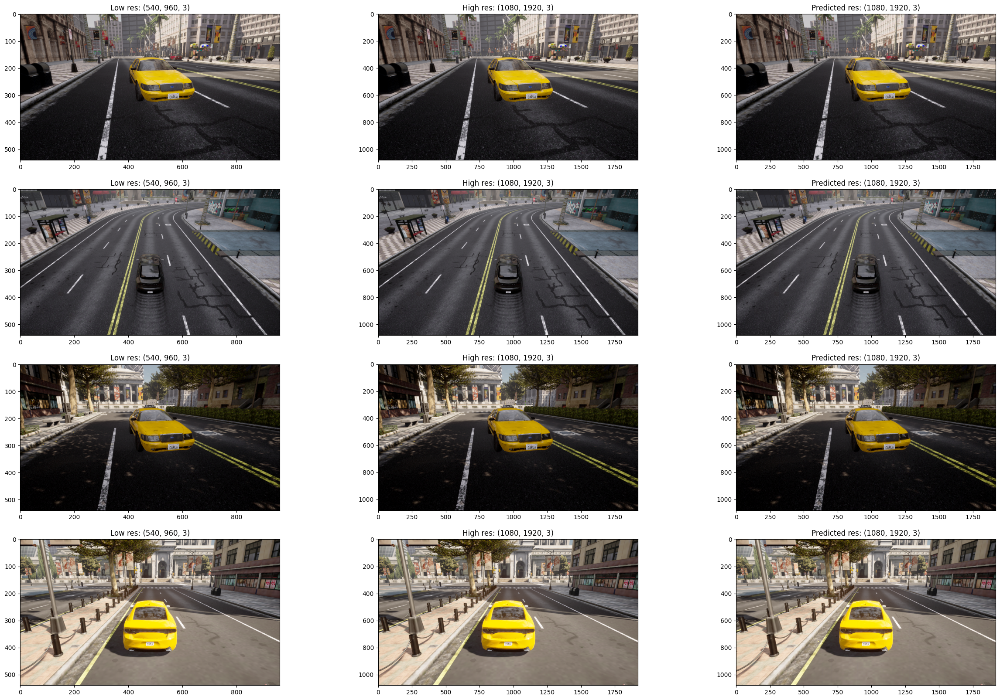

In [27]:
# Show 4 images, real vs predicted

fig, axes = plt.subplots(4, 3, figsize=(30, 20))

for i in range(4):
    index = indices[i]
    image_index = full_test_dataset.get_index_for_image(index)

    low_res, high_res = full_test_dataset.get_full_image(image_index)

    low_res_image = tensor_to_image(low_res)
    high_res_image = tensor_to_image(high_res)
    pred_high_res_image = tensor_to_image(predicted_images[i])
    
    axes[i][0].set_title(f'Low res: {low_res_image.shape}')
    axes[i][1].set_title(f'High res: {high_res_image.shape}')
    axes[i][2].set_title(f'Predicted res: {pred_high_res_image.shape}')

    axes[i][0].imshow(low_res_image)
    axes[i][1].imshow(high_res_image)
    axes[i][2].imshow(pred_high_res_image)

plt.show()

In [28]:
def compute_mean_psnrs_ssims(model, dataset, subpart_size, batch_size=2048):
    psnr = np.zeros(subpart_size)
    ssim = np.zeros(subpart_size)

    # array of unique indices
    number_patch_per_image = dataset.get_number_patch_per_image()
    number_image_per_gen = batch_size // number_patch_per_image
    indices_patch = np.zeros(subpart_size, dtype=np.int32)
    indices_image = np.zeros(subpart_size, dtype=np.int32)

    for i in range(subpart_size):
        indices_patch[i] = number_patch_per_image * i

        indices_image[i] = dataset.get_index_for_image(indices_patch[i])

    # iterate on indices_patch, image by an overbatch of number_image_per_gen
    for i in range(0, subpart_size, number_image_per_gen):
        sub_indices_patch = indices_patch[i:i+number_image_per_gen]
        sub_indices_image = indices_image[i:i+number_image_per_gen]

        predicted_images = predict_full_multiple_images(model, 1920, 1080, dataset, sub_indices_patch, batch_size=batch_size)

        for j in range(len(predicted_images)):
            #print("Do step ", i + j, "out of", subpart_size)
            _, high_res = dataset.get_full_image(sub_indices_image[j])
            pred_high_res = predicted_images[j]

            high_res_np = tensor_to_numpy(high_res)
            pred_high_res_np = tensor_to_numpy(pred_high_res)

            psnr[i + j] = metrics.peak_signal_noise_ratio(high_res_np, pred_high_res_np)
            ssim[i + j] = metrics.structural_similarity(high_res_np, pred_high_res_np, win_size=7, data_range=1, multichannel=True, channel_axis=2)

    return psnr, ssim

In [29]:
# compute the mean and var psnr and ssim for 100 images from the test set

batch_size = full_test_dataset.get_number_patch_per_image() * 4

subpart_size = len(full_test_dataset) // full_test_dataset.get_number_patch_per_image()
print("Number of images in full data set part", subpart_size)
test_psnr, test_ssim = compute_mean_psnrs_ssims(exp1, full_test_dataset, subpart_size, batch_size)

# compute the mean and var psnr and ssim for 100 images from the train set

subpart_size = len(full_train_dataset) // full_train_dataset.get_number_patch_per_image() 
print("Number of images in full data set part", subpart_size)
train_psnr, train_ssim = compute_mean_psnrs_ssims(exp1, full_train_dataset, subpart_size, batch_size)


print("Average PSNR for test images", test_psnr.mean(), "Variance", test_psnr.var())
print("Average SSIM for test images", test_ssim.mean(), "Variance", test_ssim.var())

print("Average PSNR for train images", train_psnr.mean(), "Variance", train_psnr.var())
print("Average SSIM for train images", train_ssim.mean(), "Variance", train_ssim.var())


Number of images in full data set part 200
Number of images in full data set part 800
Average PSNR for test images 36.335659501052504 Variance 7.537284708300368
Average SSIM for test images 0.927379029393196 Variance 0.0016993957012585027
[39.27118376 31.93885929 37.07053443 36.95517127 38.58371707 37.21325321
 38.48389212 29.96328619 40.22529605 34.96244037 37.46862306 39.29153446
 30.80598996 33.29490149 39.79125322 35.02571775 42.48476153 34.50719997
 34.26908599 39.76490262 31.7146193  38.09918696 34.28128641 40.20668106
 36.77383247 37.94277536 35.21379264 39.81439702 34.13284656 37.07790796
 32.8944557  35.90970891 33.90508455 33.80798664 38.28275355 34.18272787
 35.44262247 35.35219071 38.2058086  39.18257004 35.96184282 39.14525405
 35.64273459 36.05869198 38.64155141 35.27070941 37.22674531 33.75603926
 31.14290178 39.21221269 37.40779715 39.82559153 35.56598633 39.88193235
 36.18427889 33.91643263 33.7701013  32.32652196 34.92806153 40.32998423
 29.28401307 30.41098129 35.842